In [35]:
import pandas as pd
import numpy as np
from numpy import genfromtxt
from scipy.io.arff import loadarff
#from pymfe.mfe import MFE
#import arff

file1 = 'file1.arff'
file2 = 'Project.arff'
#raw_data = arff.load(open(file1, 'r'))['data']
raw_data = loadarff(file1)
weka_data = loadarff(file2)
df_data = pd.DataFrame(raw_data[0])
str_df = df_data.select_dtypes([object,np.float64])
str_df = str_df.stack().str.decode('utf-8').unstack()
df_data.select_dtypes([object,np.float64])
df_weka = pd.DataFrame(weka_data[0])

In [46]:
#print (str_df['DESCR'])

In [36]:
df_weka.head()

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Fence,Misc_Feature,Misc_Val,Mo_Sold,Year_Sold,Sale_Type,Sale_Condition,Sale_Price,Longitude,Latitude
0,b'One_Story_1946_and_Newer_All_Styles',b'Residential_Low_Density',141.0,31770.0,b'Pave',b'No_Alley_Access',b'Slightly_Irregular',b'Lvl',b'AllPub',b'Corner',...,b'No_Fence',b'None',0.0,5.0,2010.0,b'WD ',b'Normal',215000.0,-93.619754,42.054035
1,b'One_Story_1946_and_Newer_All_Styles',b'Residential_High_Density',80.0,11622.0,b'Pave',b'No_Alley_Access',b'Regular',b'Lvl',b'AllPub',b'Inside',...,b'Minimum_Privacy',b'None',0.0,6.0,2010.0,b'WD ',b'Normal',105000.0,-93.619756,42.053014
2,b'One_Story_1946_and_Newer_All_Styles',b'Residential_Low_Density',81.0,14267.0,b'Pave',b'No_Alley_Access',b'Slightly_Irregular',b'Lvl',b'AllPub',b'Corner',...,b'No_Fence',b'Gar2',12500.0,6.0,2010.0,b'WD ',b'Normal',172000.0,-93.619387,42.052659
3,b'One_Story_1946_and_Newer_All_Styles',b'Residential_Low_Density',93.0,11160.0,b'Pave',b'No_Alley_Access',b'Regular',b'Lvl',b'AllPub',b'Corner',...,b'No_Fence',b'None',0.0,4.0,2010.0,b'WD ',b'Normal',244000.0,-93.617320,42.051245
4,b'Two_Story_1946_and_Newer',b'Residential_Low_Density',74.0,13830.0,b'Pave',b'No_Alley_Access',b'Slightly_Irregular',b'Lvl',b'AllPub',b'Inside',...,b'Minimum_Privacy',b'None',0.0,3.0,2010.0,b'WD ',b'Normal',189900.0,-93.638933,42.060899


In [38]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
new_data = df_data
new_data.head()

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Fence,Misc_Feature,Misc_Val,Mo_Sold,Year_Sold,Sale_Type,Sale_Condition,Sale_Price,Longitude,Latitude
0,b'One_Story_1946_and_Newer_All_Styles',b'Residential_Low_Density',141.0,31770.0,b'Pave',b'No_Alley_Access',b'Slightly_Irregular',b'Lvl',b'AllPub',b'Corner',...,b'No_Fence',b'None',0.0,5.0,2010.0,b'WD ',b'Normal',215000.0,-93.619754,42.054035
1,b'One_Story_1946_and_Newer_All_Styles',b'Residential_High_Density',80.0,11622.0,b'Pave',b'No_Alley_Access',b'Regular',b'Lvl',b'AllPub',b'Inside',...,b'Minimum_Privacy',b'None',0.0,6.0,2010.0,b'WD ',b'Normal',105000.0,-93.619756,42.053014
2,b'One_Story_1946_and_Newer_All_Styles',b'Residential_Low_Density',81.0,14267.0,b'Pave',b'No_Alley_Access',b'Slightly_Irregular',b'Lvl',b'AllPub',b'Corner',...,b'No_Fence',b'Gar2',12500.0,6.0,2010.0,b'WD ',b'Normal',172000.0,-93.619387,42.052659
3,b'One_Story_1946_and_Newer_All_Styles',b'Residential_Low_Density',93.0,11160.0,b'Pave',b'No_Alley_Access',b'Regular',b'Lvl',b'AllPub',b'Corner',...,b'No_Fence',b'None',0.0,4.0,2010.0,b'WD ',b'Normal',244000.0,-93.617320,42.051245
4,b'Two_Story_1946_and_Newer',b'Residential_Low_Density',74.0,13830.0,b'Pave',b'No_Alley_Access',b'Slightly_Irregular',b'Lvl',b'AllPub',b'Inside',...,b'Minimum_Privacy',b'None',0.0,3.0,2010.0,b'WD ',b'Normal',189900.0,-93.638933,42.060899


In [99]:
predictors = ['MS_SubClass', 'MS_Zoning', 'Lot_Frontage', 'Lot_Area', 'Street',
       'Alley', 'Lot_Shape', 'Land_Contour', 'Utilities', 'Lot_Config',
       'Land_Slope', 'Neighborhood', 'Condition_1', 'Condition_2', 'Bldg_Type',
       'House_Style', 'Overall_Qual', 'Overall_Cond', 'Year_Built',
       'Year_Remod_Add', 'Roof_Style', 'Roof_Matl', 'Exterior_1st',
       'Exterior_2nd', 'Mas_Vnr_Type', 'Mas_Vnr_Area', 'Exter_Qual',
       'Exter_Cond', 'Foundation', 'Bsmt_Qual', 'Bsmt_Cond', 'Bsmt_Exposure',
       'BsmtFin_Type_1', 'BsmtFin_SF_1', 'BsmtFin_Type_2', 'BsmtFin_SF_2',
       'Bsmt_Unf_SF', 'Total_Bsmt_SF', 'Heating', 'Heating_QC', 'Central_Air',
       'Electrical', 'First_Flr_SF', 'Second_Flr_SF', 'Low_Qual_Fin_SF',
       'Gr_Liv_Area', 'Bsmt_Full_Bath', 'Bsmt_Half_Bath', 'Full_Bath',
       'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'Kitchen_Qual',
       'TotRms_AbvGrd', 'Functional', 'Fireplaces', 'Fireplace_Qu',
       'Garage_Type', 'Garage_Finish', 'Garage_Cars', 'Garage_Area',
       'Garage_Qual', 'Garage_Cond', 'Paved_Drive', 'Wood_Deck_SF',
       'Open_Porch_SF', 'Enclosed_Porch', 'Three_season_porch', 'Screen_Porch',
       'Pool_Area', 'Pool_QC', 'Fence', 'Misc_Feature', 'Misc_Val', 'Mo_Sold',
       'Year_Sold', 'Sale_Type', 'Sale_Condition', 'Longitude',
       'Latitude']
target =  'Sale_Price'

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, auc, roc_curve
from sklearn.tree import DecisionTreeClassifier, export_graphviz
#import graphviz


In [4]:
new_data.columns

Index(['MS_SubClass', 'MS_Zoning', 'Lot_Frontage', 'Lot_Area', 'Street',
       'Alley', 'Lot_Shape', 'Land_Contour', 'Utilities', 'Lot_Config',
       'Land_Slope', 'Neighborhood', 'Condition_1', 'Condition_2', 'Bldg_Type',
       'House_Style', 'Overall_Qual', 'Overall_Cond', 'Year_Built',
       'Year_Remod_Add', 'Roof_Style', 'Roof_Matl', 'Exterior_1st',
       'Exterior_2nd', 'Mas_Vnr_Type', 'Mas_Vnr_Area', 'Exter_Qual',
       'Exter_Cond', 'Foundation', 'Bsmt_Qual', 'Bsmt_Cond', 'Bsmt_Exposure',
       'BsmtFin_Type_1', 'BsmtFin_SF_1', 'BsmtFin_Type_2', 'BsmtFin_SF_2',
       'Bsmt_Unf_SF', 'Total_Bsmt_SF', 'Heating', 'Heating_QC', 'Central_Air',
       'Electrical', 'First_Flr_SF', 'Second_Flr_SF', 'Low_Qual_Fin_SF',
       'Gr_Liv_Area', 'Bsmt_Full_Bath', 'Bsmt_Half_Bath', 'Full_Bath',
       'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'Kitchen_Qual',
       'TotRms_AbvGrd', 'Functional', 'Fireplaces', 'Fireplace_Qu',
       'Garage_Type', 'Garage_Finish', 'Garage_Cars', 'G

In [47]:
labelencoder=LabelEncoder()
for column in df_data.columns:
    df_data[column] = labelencoder.fit_transform(df_data[column])

In [48]:
df_data.describe()

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Fence,Misc_Feature,Misc_Val,Mo_Sold,Year_Sold,Sale_Type,Sale_Condition,Sale_Price,Longitude,Latitude
count,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,...,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000
mean,6.158703,4.967235,38.349147,889.458362,0.995904,0.985666,2.297270,2.777816,0.001706,3.055290,...,3.494881,2.064846,0.541638,5.216041,1.790444,8.358703,3.779863,442.135836,1390.729352,1376.254949
std,5.008058,0.865652,26.156382,545.129327,0.063876,0.259604,0.541888,0.703199,0.055406,1.603922,...,1.090075,0.364749,3.349323,2.714492,1.316613,1.877433,1.076299,251.979695,800.950203,794.844741
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,5.000000,20.000000,418.250000,1.000000,1.000000,2.000000,3.000000,0.000000,2.000000,...,4.000000,2.000000,0.000000,3.000000,1.000000,9.000000,4.000000,243.000000,697.250000,687.250000
50%,3.000000,5.000000,40.000000,856.500000,1.000000,1.000000,2.000000,3.000000,0.000000,4.000000,...,4.000000,2.000000,0.000000,5.000000,2.000000,9.000000,4.000000,398.000000,1389.500000,1376.500000
75%,12.000000,5.000000,55.000000,1328.750000,1.000000,1.000000,3.000000,3.000000,0.000000,4.000000,...,4.000000,2.000000,0.000000,7.000000,3.000000,9.000000,4.000000,629.000000,2084.750000,2061.750000
max,15.000000,6.000000,128.000000,1959.000000,1.000000,2.000000,3.000000,3.000000,2.000000,4.000000,...,4.000000,5.000000,37.000000,11.000000,4.000000,9.000000,5.000000,1031.000000,2768.000000,2746.000000


In [ ]:
new_data = df_data

In [50]:
new_data

,MS_SubClass,MS_Zoning,Lot_Frontage,Lot_Area,Street,Alley,Lot_Shape,Land_Contour,Utilities,Lot_Config,...,Fence,Misc_Feature,Misc_Val,Mo_Sold,Year_Sold,Sale_Type,Sale_Condition,Sale_Price,Longitude,Latitude
0,2,5,115,1927,1,1,3,3,0,0,...,4,2,0,4,4,9,4,634,2167,2277
1,2,4,57,1338,1,1,2,3,0,4,...,2,2,0,5,4,9,4,138,2166,2230
2,2,5,58,1680,1,1,3,3,0,0,...,4,1,35,5,4,9,4,450,2179,2217
3,2,5,70,1255,1,1,2,3,0,0,...,4,2,0,3,4,9,4,723,2258,2117
4,13,5,51,1644,1,1,3,3,0,4,...,2,2,0,2,4,9,4,537,1512,2593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,10,5,14,514,1,1,3,3,0,1,...,0,2,0,2,0,9,4,306,2653,26
2926,2,5,0,729,1,1,3,2,0,4,...,2,2,0,5,0,9,4,250,2724,19
2927,9,5,39,1099,1,1,2,3,0,4,...,2,4,17,6,0,9,4,256,2593,3
2928,2,5,54,997,1,1,2,3,0,4,...,4,2,0,3,0,9,4,443,2756,40


In [87]:
#del(price)
#del(prices)
#del(weka)
#del(dfPearson)

In [11]:
#dfPearson = pd.get_dummies(new_data)

In [70]:
dfPearson = new_data

In [71]:

#dfPearson = pd.get_dummies(df_data)

prices = dfPearson.corr() 
prices.head()
price = prices["Sale_Price"]
price = pd.DataFrame(price).T

#size = len(price.columns)
#price
#df_data.head()
#del(price)
#print(len(price.columns))
#print(price.columns[3].index)
#print(price[price.columns[3]])

In [72]:
prices["Year_Sold"]

MS_SubClass      -0.039795
MS_Zoning        -0.024299
Lot_Frontage     -0.010515
Lot_Area         -0.024705
Street           -0.018328
                    ...   
Sale_Type         0.027382
Sale_Condition   -0.016423
Sale_Price       -0.025741
Longitude         0.005622
Latitude         -0.009703
Name: Year_Sold, Length: 81, dtype: float64

In [73]:



#newprice = price
#newprice
#print(price.keys)
#price.drop(price[0,2])
price.columns


i=0
cont=0
while i < (len(price.columns)):
    #print("{"+str(price.values[0,i])+"}")
    #print(price.columns[i])
    #print(i)
    #print(price.values[0,i] < (0.000000))
    price.values[0,i]
    cont += 1
    if cont > 1000:
        print(cont)
        break
    elif price.values[0,i] < (0.150):
        price.drop(price.columns[i],inplace=True,axis=1)
        new_data.drop(new_data.columns[i],inplace=True,axis=1)
        #old_data.drop(old_data.columns[i],inplace=True,axis=1)
        #i += 1
    elif i+1 > len(price.columns):
        i += 0
    else :
        i += 1
        


In [ ]:
len(price.columns)
#print(newprice)
#price
new_data

In [16]:
old_data

NameError: name 'old_data' is not defined

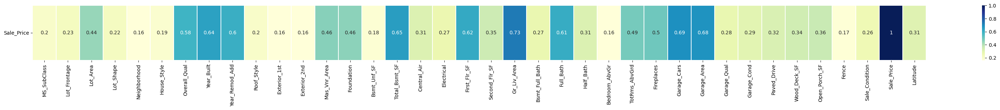

In [74]:
plt.figure(figsize=(40,2))
#dfDummies = pd.get_dummies(price)
#prices = dfDummies.corr(method='pearson') 
#prices = dfDummies.pivot('Year_Sold',target,'Sale_Price')
#ax = sns.heatmap(price,cmap='YlGnBu')
sns.heatmap(price,linewidths=.1,cmap="YlGnBu", annot=True)
plt.yticks(rotation=0);

In [77]:
# data preparation
# convert to float to have precise and homogenoues computation
dataset = new_data.astype(float)
print("dataset shape", dataset.shape)

#remove categories with low corr from the main dataframe



# get features by removing id and class
# remove id
X = dataset.iloc[:,0:]
print("X shape", X.shape)

# get class label
y = dataset.iloc[:,0]
#y = dataset.loc[:,0]
print("y shape", y.shape)

dataset shape (2930, 38)
X shape (2930, 38)
y shape (2930,)


In [82]:
dataset
print(X.head())
print(y.head())

   MS_SubClass  Lot_Frontage  Lot_Area  Lot_Shape  Neighborhood  House_Style  \
0          2.0         115.0    1927.0        3.0          15.0          0.0   
1          2.0          57.0    1338.0        2.0          15.0          0.0   
2          2.0          58.0    1680.0        3.0          15.0          0.0   
3          2.0          70.0    1255.0        2.0          15.0          0.0   
4         13.0          51.0    1644.0        3.0           8.0          5.0   

   Overall_Qual  Year_Built  Year_Remod_Add  Roof_Style  ...  Garage_Area  \
0           0.0        67.0            10.0         3.0  ...        266.0   
1           1.0        68.0            11.0         1.0  ...        428.0   
2           0.0        65.0             8.0         3.0  ...         85.0   
3           5.0        75.0            18.0         3.0  ...        260.0   
4           1.0       104.0            48.0         1.0  ...        224.0   

   Garage_Qual  Garage_Cond  Paved_Drive  Wood_Deck_SF  

In [83]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42)

print (X_train.shape, X_test.shape)

(2344, 38) (586, 38)


In [79]:

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Create the classifier
for i in range(1,20):
    kNN = KNeighborsClassifier(n_neighbors=i)
    
    # Train the classifier
    kNN.fit(X_train,y_train)

    # Generate predictions
    y_pred = kNN.predict(X_test)

    # compute Accuracy
    acc = accuracy_score(y_true=y_test, y_pred=y_pred)
    if i <= 1:
        accmin = acc
        accmax = acc
        accavg = acc
        
    if acc < accmin:
        accmin = acc
        
    if acc > accmax:
        accmax = acc
         
    accavg += acc
    print (f"Accuracy {acc:.5f}")

print ("Min Accuracy: {:.5f} | Max Accuracy {:.5f} | Avg Accuracy {:.5f}".format(accmin,accmax,accavg/(i+1)) )


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.75939
Accuracy 0.76621
Accuracy 0.77133
Accuracy 0.77474


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.78157
Accuracy 0.76109


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.76621
Accuracy 0.76451


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.76621
Accuracy 0.77133


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.77304
Accuracy 0.77133


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.76621
Accuracy 0.76792


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.76280
Accuracy 0.76280


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.76621
Accuracy 0.77133


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

Accuracy 0.77133
Min Accuracy: 0.75939 | Max Accuracy 0.78157 | Avg Accuracy 0.76775


In [27]:
for f in X.columns:
    print ("Feature {:20} -> Scale: {:7.2f}".format(f, X.loc[:,f].max() - X.loc[:,f].min()) )

Feature MS_SubClass          -> Scale:   15.00
Feature Lot_Frontage         -> Scale:  128.00
Feature Lot_Area             -> Scale: 1959.00
Feature Alley                -> Scale:    2.00
Feature Lot_Shape            -> Scale:    3.00
Feature Neighborhood         -> Scale:   27.00
Feature Condition_1          -> Scale:    8.00
Feature House_Style          -> Scale:    7.00
Feature Overall_Qual         -> Scale:    9.00
Feature Year_Built           -> Scale:  117.00
Feature Year_Remod_Add       -> Scale:   60.00
Feature Roof_Style           -> Scale:    5.00
Feature Exterior_1st         -> Scale:   15.00
Feature Exterior_2nd         -> Scale:   16.00
Feature Mas_Vnr_Area         -> Scale:  444.00
Feature Exter_Cond           -> Scale:    4.00
Feature Foundation           -> Scale:    5.00
Feature Bsmt_Cond            -> Scale:    5.00
Feature Bsmt_Unf_SF          -> Scale: 1136.00
Feature Total_Bsmt_SF        -> Scale: 1057.00
Feature Central_Air          -> Scale:    1.00
Feature Elect

In [85]:
from sklearn.preprocessing import MinMaxScaler

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

scaler = MinMaxScaler()
scaler.fit(X_train)
 
for k in range(1,21):
    
    kNN = KNeighborsClassifier(n_neighbors=k)
    kNN.fit( scaler.transform(X_train), y_train )
    y_pred = kNN.predict( scaler.transform(X_test) )

    # compute Accuracy
    acc = accuracy_score(y_true=y_test, y_pred=y_pred)
    if k <= 1:
        accmin = acc
        accmax = acc
        accavg = acc
        
    if acc < accmin:
        accmin = acc
        
    if acc > accmax:
        accmax = acc
         
    accavg += acc
    print ("k: {:2d} | Accuracy {:.5f}".format(k,acc) )

print ("Min Accuracy: {:.5f} | Max Accuracy {:.5f} | Avg Accuracy {:.5f}".format(accmin,accmax,accavg/(k+1)) )


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  1 | Accuracy 0.81696
k:  2 | Accuracy 0.81282


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  3 | Accuracy 0.82937
k:  4 | Accuracy 0.81489


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  5 | Accuracy 0.82420
k:  6 | Accuracy 0.81179


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  7 | Accuracy 0.81593
k:  8 | Accuracy 0.80352


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  9 | Accuracy 0.80248
k: 10 | Accuracy 0.79938


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 11 | Accuracy 0.79731
k: 12 | Accuracy 0.78800


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 13 | Accuracy 0.78697
k: 14 | Accuracy 0.78490


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k: 15 | Accuracy 0.79111
k: 16 | Accuracy 0.78490


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 17 | Accuracy 0.78697
k: 18 | Accuracy 0.77559


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 19 | Accuracy 0.77973
k: 20 | Accuracy 0.76525
Min Accuracy: 0.76525 | Max Accuracy 0.82937 | Avg Accuracy 0.79948


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [84]:
from sklearn.preprocessing import StandardScaler

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

scaler = StandardScaler()
scaler.fit(X_train)

for k in range(1,21):

    kNN = KNeighborsClassifier(n_neighbors=k)
    kNN.fit(scaler.transform(X_train),y_train)
    y_pred = kNN.predict( scaler.transform(X_test) )

    # compute Accuracy
    acc = accuracy_score(y_true=y_test, y_pred=y_pred)
    if k <= 1:
        accmin = acc
        accmax = acc
        accavg = acc
        
    if acc < accmin:
        accmin = acc
        
    if acc > accmax:
        accmax = acc
         
    accavg += acc
    print ("k: {:2d} | Accuracy {:.5f}".format(k,acc) )

print ("Min Accuracy: {:.5f} | Max Accuracy {:.5f} | Avg Accuracy {:.5f}".format(accmin,accmax,accavg/(k+1)) )


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  1 | Accuracy 0.78077
k:  2 | Accuracy 0.78800


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  3 | Accuracy 0.79628
k:  4 | Accuracy 0.79214


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  5 | Accuracy 0.79007
k:  6 | Accuracy 0.78490


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  7 | Accuracy 0.78800
k:  8 | Accuracy 0.77870


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k:  9 | Accuracy 0.79835
k: 10 | Accuracy 0.77973


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 11 | Accuracy 0.78180
k: 12 | Accuracy 0.77146


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 13 | Accuracy 0.77146
k: 14 | Accuracy 0.77456


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 15 | Accuracy 0.77766
k: 16 | Accuracy 0.77146


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

k: 17 | Accuracy 0.77146
k: 18 | Accuracy 0.76732
k: 19 | Accuracy 0.76525
k: 20 | Accuracy 0.76319
Min Accuracy: 0.76319 | Max Accuracy 0.79835 | Avg Accuracy 0.77968


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepd

In [100]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
X, y, test_size=0.33, random_state=42)

scaler = MinMaxScaler()
scaler.fit(X_train)

for k in range(1,21):
    gbm = lgb.LGBMClassifier(n_neighbors=k)
    gbm.fit( scaler.transform(X_train), y_train )
    y_pred = gbm.predict( scaler.transform(X_test) )

    # compute Accuracy
    acc = accuracy_score(y_true=y_test, y_pred=y_pred)
    if k <= 1:
        accmin = acc
        accmax = acc
        accavg = acc

    if acc < accmin:
        accmin = acc

    if acc > accmax:
        accmax = acc

    accavg += acc
print ("k: {:2d} | Accuracy {:.5f}".format(k,acc) )

[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [Warning] Unknown parameter: n_neighbors
[LightGBM] [

In [30]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

def my_distance(a,b):
    return 10*abs(a[0]-b[0]) + abs(a[1]-b[1])

for k in range(1,11):
    
    kNN = KNeighborsClassifier(n_neighbors = k, 
                                         metric = my_distance)
    kNN.fit( X_train ,y_train)
    y_pred = kNN.predict( X_test )

    # compute accuracy
    acc = accuracy_score(y_true=y_test, y_pred=y_pred)
    if k <= 1:
        accmin = acc
        accmax = acc
        accavg = acc
        
    if acc < accmin:
        accmin = acc
        
    if acc > accmax:
        accmax = acc
         
    accavg += acc
    print ("k: {:2d} | Accuracy {:.5f}".format(k,acc) )

print ("Min Accuracy: {:.5f} | Max Accuracy {:.5f} | Avg Accuracy {:.5f}".format(accmin,accmax,accavg/(k+1)) )


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  1 | Accuracy 0.99586


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  2 | Accuracy 0.99483


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  3 | Accuracy 0.99276


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  4 | Accuracy 0.99173


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  5 | Accuracy 0.98966


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  6 | Accuracy 0.98862


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  7 | Accuracy 0.98862


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  8 | Accuracy 0.98862


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


k:  9 | Accuracy 0.98656
k: 10 | Accuracy 0.98552
Min Accuracy: 0.98552 | Max Accuracy 0.99586 | Avg Accuracy 0.99079


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [91]:
# Package imports
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import sklearn.datasets
import sklearn.linear_model
import matplotlib
import pandas as pd

In [89]:
#from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# create a (quasi)random dataset
N_SAMPLES = 1000
N_CENTERS = 6


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# train and predict
dt = DecisionTreeClassifier(max_leaf_nodes=12) # change this!
dt.fit(X_train,y_train)

# compute Accuracy
train_acc = accuracy_score(y_true = y_train, y_pred = dt.predict(X_train))
test_acc  = accuracy_score(y_true = y_test,  y_pred = dt.predict(X_test))
print ("Train Accuracy: {:.3f} - Test Accuracy: {:.3f}".format(train_acc,test_acc) )

#model_decision_boundary(dt, X_test, y_test)
#plot_decision_boundary(lambda x: dt.predict(x))
#plt.title("Decision Tree")

Train Accuracy: 0.985 - Test Accuracy: 0.988


In [88]:
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

#X, y = make_moons(n_samples=1000, noise=0.1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

for max_leaves in range(2,20):
    # train and predict
    dt = DecisionTreeClassifier(max_leaf_nodes=max_leaves)
    dt.fit(X_train,y_train)

    # compute Accuracy
    train_acc = accuracy_score(y_true = y_train, y_pred = dt.predict(X_train))
    test_acc  = accuracy_score(y_true = y_test,  y_pred = dt.predict(X_test))
    print ("Train Accuracy: {:.3f} - Test Accuracy: {:.3f}".format(train_acc,test_acc) )

Train Accuracy: 0.561 - Test Accuracy: 0.571
Train Accuracy: 0.658 - Test Accuracy: 0.671
Train Accuracy: 0.705 - Test Accuracy: 0.720
Train Accuracy: 0.746 - Test Accuracy: 0.770
Train Accuracy: 0.809 - Test Accuracy: 0.840
Train Accuracy: 0.858 - Test Accuracy: 0.873
Train Accuracy: 0.898 - Test Accuracy: 0.914
Train Accuracy: 0.932 - Test Accuracy: 0.958
Train Accuracy: 0.956 - Test Accuracy: 0.972
Train Accuracy: 0.975 - Test Accuracy: 0.984
Train Accuracy: 0.985 - Test Accuracy: 0.988
Train Accuracy: 0.991 - Test Accuracy: 0.992
Train Accuracy: 0.997 - Test Accuracy: 0.997
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999


In [93]:
from sklearn import tree
from sklearn.metrics import accuracy_score

#X, y = make_moons(n_samples=1000, noise=0.1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# train and predict
dt = tree.DecisionTreeClassifier(max_depth=4) # change this!
dt.fit(X_train,y_train)

#model_decision_boundary(dt, X_test, y_test)

DecisionTreeClassifier(max_depth=4)

In [94]:
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import accuracy_score

#X, y = make_moons(n_samples=1000, noise=0.1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

for max_depth in range(2,20):
    # train and predict
    dt = tree.DecisionTreeClassifier(max_depth=max_depth,max_leaf_nodes=max_depth)
    dt.fit(X_train,y_train)

    # compute Accuracy
    train_acc = accuracy_score(y_true = y_train, y_pred = dt.predict(X_train))
    test_acc  = accuracy_score(y_true = y_test,  y_pred = dt.predict(X_test))
    print ("Train Accuracy: {:.3f} - Test Accuracy: {:.3f}".format(train_acc,test_acc) )

Train Accuracy: 0.561 - Test Accuracy: 0.571
Train Accuracy: 0.658 - Test Accuracy: 0.671
Train Accuracy: 0.705 - Test Accuracy: 0.720
Train Accuracy: 0.746 - Test Accuracy: 0.770
Train Accuracy: 0.809 - Test Accuracy: 0.840
Train Accuracy: 0.858 - Test Accuracy: 0.873
Train Accuracy: 0.898 - Test Accuracy: 0.914
Train Accuracy: 0.932 - Test Accuracy: 0.958
Train Accuracy: 0.956 - Test Accuracy: 0.972
Train Accuracy: 0.975 - Test Accuracy: 0.984
Train Accuracy: 0.985 - Test Accuracy: 0.988
Train Accuracy: 0.991 - Test Accuracy: 0.992
Train Accuracy: 0.997 - Test Accuracy: 0.998
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999
Train Accuracy: 1.000 - Test Accuracy: 0.999


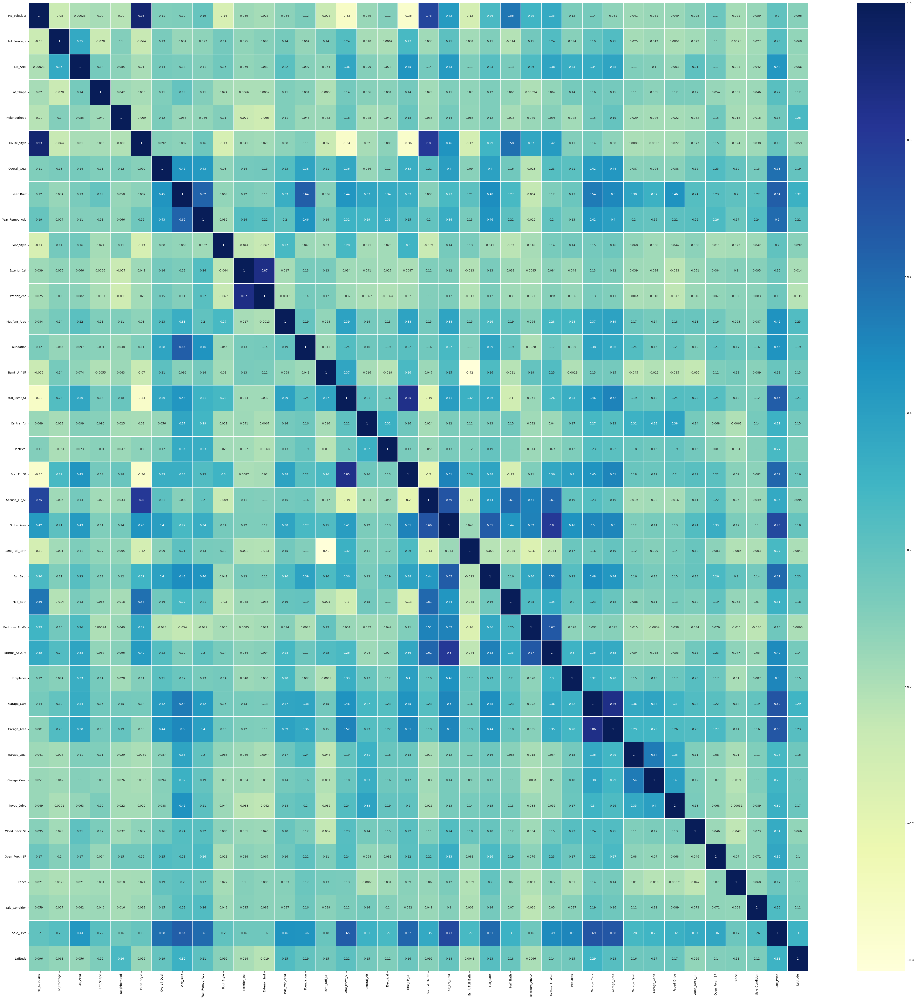

In [95]:
plt.figure(figsize=(61,61))
sns.heatmap(dfPearson.corr(),linewidths=.1,cmap="YlGnBu", annot=True)
plt.yticks(rotation=0);

In [96]:
# data preparation
# convert to float to have precise and homogenoues computation
dataset = df_data.astype(float)
print("dataset shape", dataset.shape)

# get features by removing id and class
# remove id
X = dataset.loc[:,:]
print("X shape", X.shape)

# get class label
y = dataset.index
#y = dataset.loc[:,0]
print("y shape", y.shape)

dataset shape (2930, 38)
X shape (2930, 38)
y shape (2930,)


In [97]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)

print (X_train.shape, X_test.shape)

(1963, 38) (967, 38)


In [98]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Create the classifier
kNN = KNeighborsClassifier(n_neighbors=10)

# Train the classifier
kNN.fit(X_train,y_train)

# Generate predictions
y_pred = kNN.predict(X_test)

# compute Accuracy
acc = accuracy_score(y_true=y_test, y_pred=y_pred)
print (f"Accuracy {acc:.3f}")

Accuracy 0.000


E:\Program Files\Anaconda\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X,y)

In [ ]:
df_weka.head()

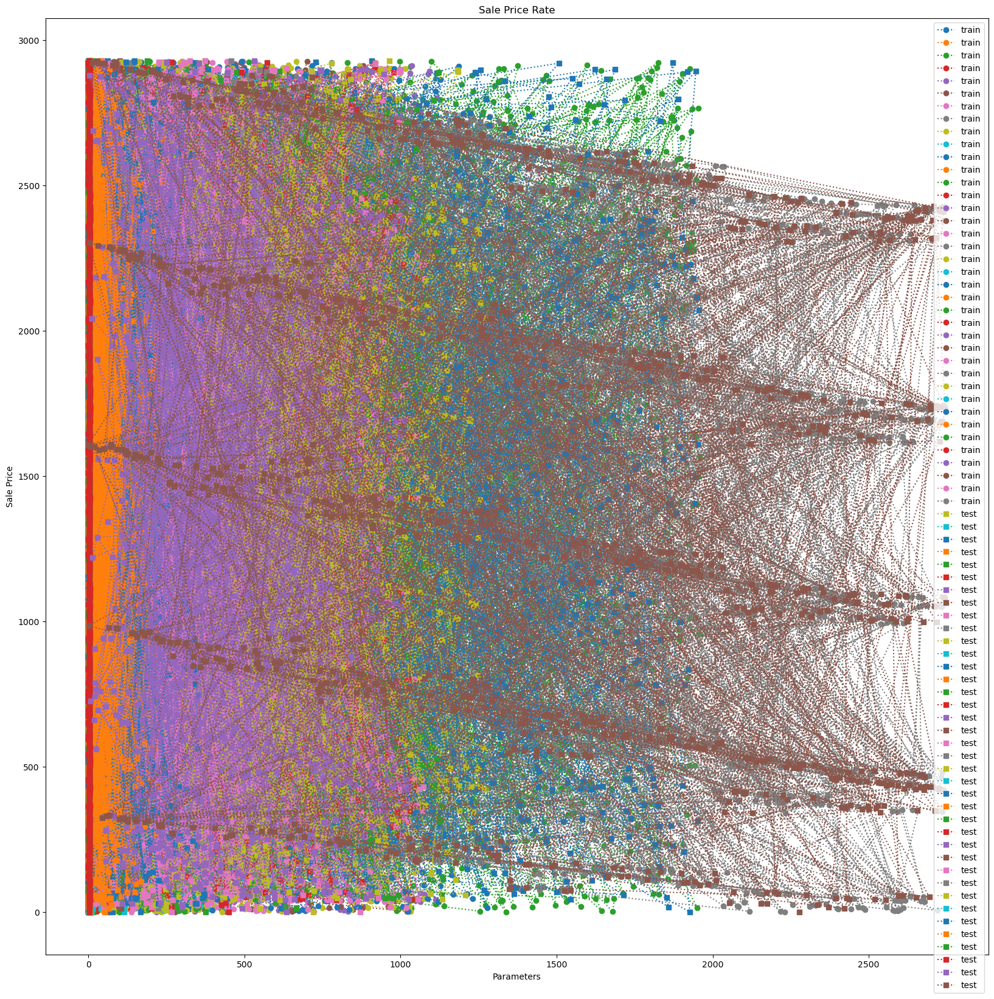

In [103]:
fig, ax = plt.subplots(figsize=(20,20))
ax.plot(X_train, y_train, 'o:', label='train')
ax.plot(X_test, y_test, 's:', label='test')
ax.set_title("Sale Price Rate")
ax.set_xlabel("Parameters")
ax.set_ylabel("Sale Price")
ax.legend();

            


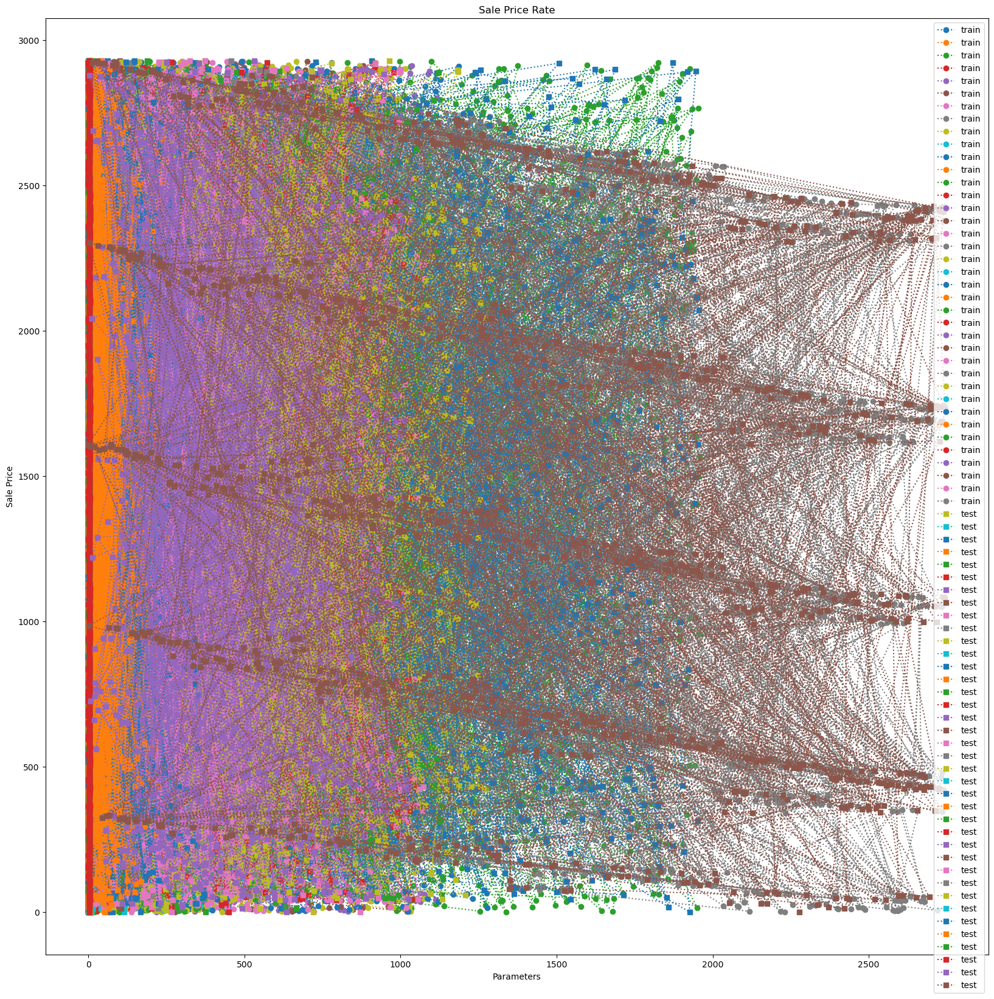

In [104]:
from sklearn.linear_model import LinearRegression 

model = LinearRegression(fit_intercept=True)
model.fit(X_train, y_train)

y_pred = model.predict(X) # note: predicting on both train and test

fig, ax = plt.subplots(figsize=(20,20))
ax.plot(X_train, y_train, 'o:', label='train')
ax.plot(X_test, y_test, 's:', label='test')
ax.set_title("Sale Price Rate")
ax.set_xlabel("Parameters")
ax.set_ylabel("Sale Price")
ax.legend();


In [106]:
from sklearn.metrics import mean_squared_error

print ("Train Error: {:.3f}".format( mean_squared_error(y_true = y_train, 
                                          y_pred = y_pred[:len(X_train)])) )
print ("Test Error : {:.3f}".format( mean_squared_error(y_true = y_test,  
                                          y_pred = y_pred[len(X_train):])) )

Train Error: 771343.512
Test Error : 788405.869


In [107]:
print ("Intercept: ", model.intercept_)       # b0
print ("Coefficients [slopes]:", model.coef_) # b1

Intercept:  1370.060342808733
Coefficients [slopes]: [ 4.06455359e+01  2.93494186e-01  2.15803621e-02  2.84767685e+01
 -5.20377710e+00 -5.48050321e+01  1.00496575e+00  1.22136546e+00
 -4.14349944e+00  1.80513389e+01 -2.28425313e+01  2.21102479e+01
 -3.06307765e-01  1.08369917e+01  5.60614734e-02 -4.68006153e-02
  1.10788766e+02 -1.19266180e+01  5.43889656e-01  5.17718873e-01
 -6.69172559e-01 -7.18356989e+01 -1.00078504e+02 -5.95002744e+01
  3.59308606e+01  4.53569097e+01 -2.40981529e+01  9.41887791e+01
 -3.96407798e-01 -6.68699440e+01  2.27773612e+01 -3.56133234e+01
 -1.14991524e-01  8.58132883e-01  2.93855206e+01  1.88194253e+01
  3.72239448e-01 -2.21264494e-01]


In [108]:
from sklearn.preprocessing import PolynomialFeatures 
# see https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html

poly = PolynomialFeatures(2, include_bias=False)

poly.fit(X_train) # just computes the number of additional features

poly.transform(X_train)

array([[2.000000e+00, 4.400000e+01, 6.080000e+02, ..., 4.692250e+05,
        9.179000e+04, 1.795600e+04],
       [1.300000e+01, 0.000000e+00, 1.475000e+03, ..., 4.422250e+05,
        1.737645e+06, 6.827769e+06],
       [2.000000e+00, 4.900000e+01, 7.590000e+02, ..., 8.410000e+04,
        5.098200e+05, 3.090564e+06],
       ...,
       [1.300000e+01, 4.100000e+01, 7.060000e+02, ..., 3.636090e+05,
        1.270521e+06, 4.439449e+06],
       [5.000000e+00, 5.800000e+01, 3.910000e+02, ..., 4.368100e+04,
        2.227940e+05, 1.136356e+06],
       [9.000000e+00, 3.700000e+01, 3.750000e+02, ..., 6.864400e+04,
        1.771120e+05, 4.569760e+05]])

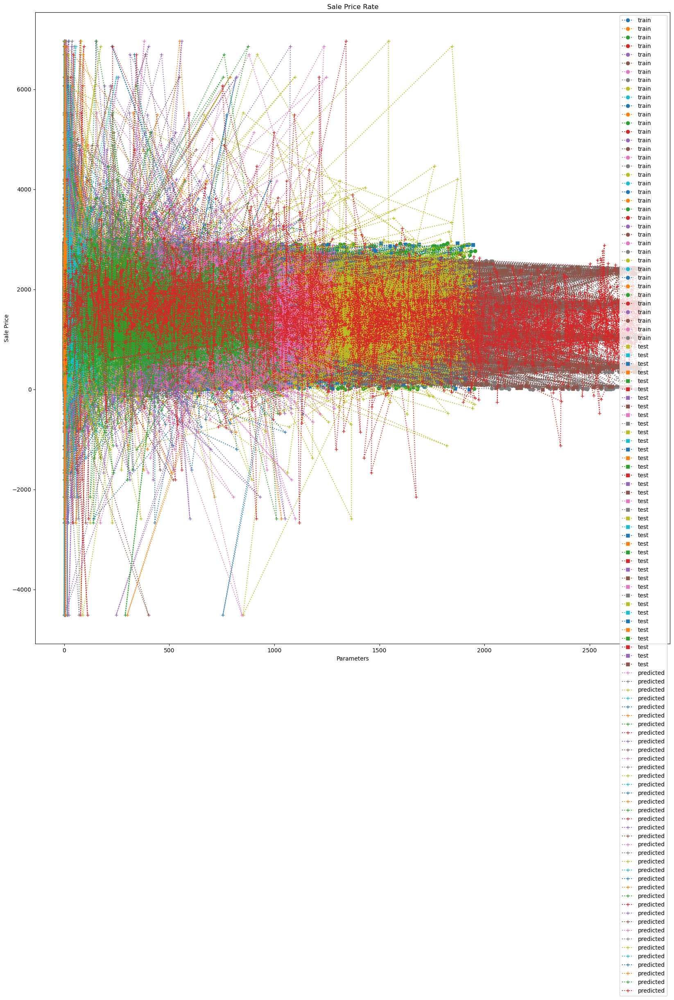

In [109]:
from sklearn.linear_model import LinearRegression 
from sklearn.preprocessing import PolynomialFeatures 

# prepare the data
poly = PolynomialFeatures(2, include_bias=False)
poly.fit(X_train) # just computes the number of additional features
X_train_2 = poly.transform(X_train)

# train the model
model = LinearRegression(fit_intercept=True)
model.fit(X_train_2, y_train)

y_pred = model.predict( poly.transform(X) )

fig, ax = plt.subplots(figsize=(20,20))
ax.plot(X_train, y_train, 'o:', label='train')
ax.plot(X_test, y_test, 's:', label='test')
ax.plot(X, y_pred, '+:', label='predicted')
ax.set_title("Sale Price Rate")
ax.set_xlabel("Parameters")
ax.set_ylabel("Sale Price")
ax.legend();

In [110]:
print ("Intercept: ", model.intercept_)
print ("Coefficients [slopes]:", model.coef_)
print ()

Intercept:  5657.3942713352835
Coefficients [slopes]: [-4.01169069e+02 -8.27877369e+00 -9.18657727e-01 -5.48785560e+02
 -1.13288942e+01  6.76626706e+02 -1.50423678e+02 -3.59317110e+01
 -1.27607709e+01 -1.43478825e+02  2.79340620e+02 -2.95867340e+02
  6.14604264e+00  9.32953737e+02  2.02471100e+00 -9.77188341e+00
  1.22751083e+03  2.08606908e+02  1.46293810e+01  1.43755810e+01
 -8.09589812e+00  1.19488266e+03  5.36849094e+01  6.85403553e+02
  4.44069859e+02 -6.00433765e+02 -2.84193450e+02 -2.58624137e+02
 -4.05091515e+00 -6.32746829e+02  4.05237192e+01 -1.61701728e+03
 -1.99027960e-01 -1.48226791e+00  1.75970601e+02 -4.22692626e+02
  4.07676205e+00 -4.15857296e-01  7.11776443e+00  2.49675412e-01
  4.22552946e-02  7.30285412e+01 -4.51147156e+00 -2.10947559e+01
  3.06119429e+01  6.78880264e-01  2.35501450e+00 -1.63053696e+01
 -4.54369957e+01  4.95143800e+01  1.60859853e-01 -4.94653504e+01
  6.92945507e-03 -3.70039830e-02 -6.85539940e+01  6.55719717e+00
 -4.22639340e-01 -2.89253588e-01  5.

In [111]:
print ("Intercept: ", model.intercept_)
print ("Coefficients [slopes]:", model.coef_)
print ()

Intercept:  5657.3942713352835
Coefficients [slopes]: [-4.01169069e+02 -8.27877369e+00 -9.18657727e-01 -5.48785560e+02
 -1.13288942e+01  6.76626706e+02 -1.50423678e+02 -3.59317110e+01
 -1.27607709e+01 -1.43478825e+02  2.79340620e+02 -2.95867340e+02
  6.14604264e+00  9.32953737e+02  2.02471100e+00 -9.77188341e+00
  1.22751083e+03  2.08606908e+02  1.46293810e+01  1.43755810e+01
 -8.09589812e+00  1.19488266e+03  5.36849094e+01  6.85403553e+02
  4.44069859e+02 -6.00433765e+02 -2.84193450e+02 -2.58624137e+02
 -4.05091515e+00 -6.32746829e+02  4.05237192e+01 -1.61701728e+03
 -1.99027960e-01 -1.48226791e+00  1.75970601e+02 -4.22692626e+02
  4.07676205e+00 -4.15857296e-01  7.11776443e+00  2.49675412e-01
  4.22552946e-02  7.30285412e+01 -4.51147156e+00 -2.10947559e+01
  3.06119429e+01  6.78880264e-01  2.35501450e+00 -1.63053696e+01
 -4.54369957e+01  4.95143800e+01  1.60859853e-01 -4.94653504e+01
  6.92945507e-03 -3.70039830e-02 -6.85539940e+01  6.55719717e+00
 -4.22639340e-01 -2.89253588e-01  5.

In [112]:
from sklearn.linear_model import LinearRegression 
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.metrics import mean_squared_error

for d in [1,2,4,8,16,32,64,100]:
    # prepare the data
    poly = PolynomialFeatures(d, include_bias=False)
    poly.fit(X_train)
    X_train_2 = poly.transform(X_train)

    # train the model
    model = LinearRegression(fit_intercept=True)
    model.fit(X_train_2, y_train)

    y_pred = model.predict( poly.transform(X) )

    print ("Polynomial degree:", d)
    print ("Train Error: {:.3f}".format( mean_squared_error(y_true = y_train, 
                                          y_pred = y_pred[:len(X_train)])) )
    print ("Test Error : {:.3f}".format( mean_squared_error(y_true = y_test,  
                                          y_pred = y_pred[len(X_train):])) )

Polynomial degree: 1
Train Error: 771343.512
Test Error : 788405.869
Polynomial degree: 2
Train Error: 1174645.560
Test Error : 1357741.508
Polynomial degree: 4
Train Error: 132868880.188
Test Error : 514810479.425


MemoryError: Unable to allocate 3.73 TiB for an array with shape (1963, 260932814) and data type float64